## Laboratorio 7: Aprendizaje no supervisado, semi-supervisado y activo usando K-Means

## 1. Aprendizaje no supervisado

Generamos un conjunto de datos sintético.

Se generaron 14 centros
Coordenadas de los centroides:
[[ 5.82092136 -9.13717469]
 [ 2.08022079 -3.65763261]
 [-4.32084572  0.56953232]
 [ 5.80698641  9.41187185]
 [-5.65042129 -5.72119086]
 [-8.72888181 -5.25429139]
 [ 4.2570115   0.96776255]
 [ 3.14400386  2.81437383]
 [ 2.29023245  9.44824487]
 [-9.37813955  1.61856284]
 [-4.80683543  7.83594934]
 [-5.5373256  -7.89827639]
 [-0.49138991  1.61814648]
 [-7.03480927 -2.7640598 ]]


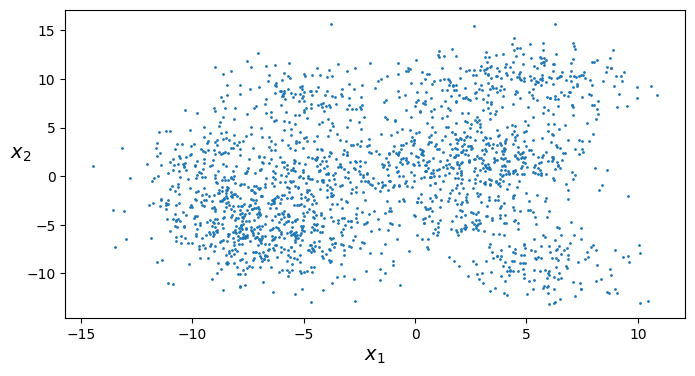

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
import random

n_centers = random.randint(1, 20)

blob_centers = []
while len(blob_centers) < n_centers:
    candidate = np.random.uniform(-10, 10, size=2)
    if all(np.linalg.norm(candidate - center) > 2 for center in blob_centers):
        blob_centers.append(candidate)

blob_centers = np.array(blob_centers)
blob_std = np.full(n_centers, 2.0)

X, y = make_blobs(n_samples=2000, centers=blob_centers,
                  cluster_std=blob_std, random_state=42)

print(f"Se generaron {n_centers} centros")

print("Coordenadas de los centroides:")
print(blob_centers)

def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=1)
    plt.xlabel("$x_1$", fontsize=14)
    plt.ylabel("$x_2$", fontsize=14, rotation=0)

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.show()

Entrenamos el modelo usando K-Means y mostramos las coordenadas de los centroides.

In [2]:
k = len(blob_centers)
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X)
y_pred

kmeans.cluster_centers_

array([[-7.24702681, -8.18067645],
       [ 3.5116749 ,  3.8366995 ],
       [-5.23945961,  7.97781945],
       [ 5.77490307, -9.15966609],
       [-8.76721701, -3.78938064],
       [ 1.06705257,  8.47151596],
       [-5.03711125, -0.29561437],
       [-9.24534987,  2.03857234],
       [ 2.10346245, -3.85446459],
       [ 7.07676786,  9.12809599],
       [-0.49105055,  1.43323391],
       [ 4.15643249, 11.44775758],
       [-4.05130527, -5.9322712 ],
       [ 4.68257085,  0.54474991]])

Generamos nuevas ubicaciones y K-Means devuelve las etiquetas para dichas ubicaciones (*hard clustering*).

In [3]:
X_new = np.array([[0, 2], [3, 2], [-3, 3], [-3, 2.5]])  # Predecir nuevas ubicaciones
kmeans.predict(X_new)

array([10,  1, 10, 10], dtype=int32)

Generamos una gráfica que muestre los centroides y las fronteras de decisión.

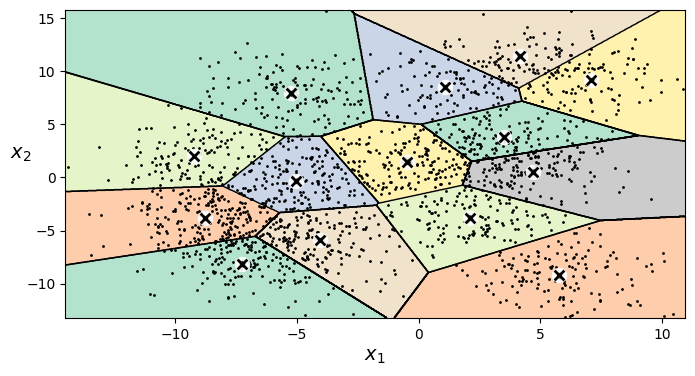

In [4]:
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=10, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=10,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, X)
plt.show()

Manera alternativa de asignar una etiqueta o grupo a una muestra utilizando *soft clustering* (puntuación) en función de su distancia al centroide.

In [5]:
kmeans.transform(X_new)  # la distancia de cada punto de X_new a cada centroide

array([[12.49662236,  3.96299453,  7.9489787 , 12.56533536, 10.5062373 ,
         6.55889625,  5.53555192,  9.24543033,  6.22087694, 10.04442112,
         0.74990295, 10.32163042,  8.90696361,  4.90349085],
       [14.44464369,  1.90664004, 10.17953929, 11.49948844, 13.11427941,
         6.75402137,  8.35852873, 12.24541062,  5.9227135 ,  8.21156432,
         3.53675808,  9.51826977, 10.61328566,  2.22458928],
       [11.96013221,  6.56520953,  5.45837575, 14.99521268,  8.9082255 ,
         6.81750713,  3.8743898 ,  6.31891907,  8.54570148, 11.79384631,
         2.95796946, 11.07154615,  8.99392637,  8.06536718],
       [11.49408918,  6.64745633,  5.91791224, 14.59269466,  8.53329367,
         7.22495117,  3.45908687,  6.26237259,  8.15012572, 12.06121498,
         2.72631936, 11.45761283,  8.49755497,  7.92747739]])

Este algoritmo comienza eligiendo algunos puntos al azar como centroides. Luego, en cada paso, agrupa las muestras según el centroide más cercano y actualiza la posición de cada centroide calculando el promedio de los puntos que le han tocado. Así, poco a poco, los grupos y sus centros se van ajustando hasta que todo queda bien repartido.

KMeans(algorithm='elkan', max_iter=1, n_clusters=14, n_init=1, random_state=4)
KMeans(algorithm='elkan', max_iter=2, n_clusters=14, n_init=1, random_state=1)
KMeans(algorithm='elkan', max_iter=3, n_clusters=14, n_init=1, random_state=5)


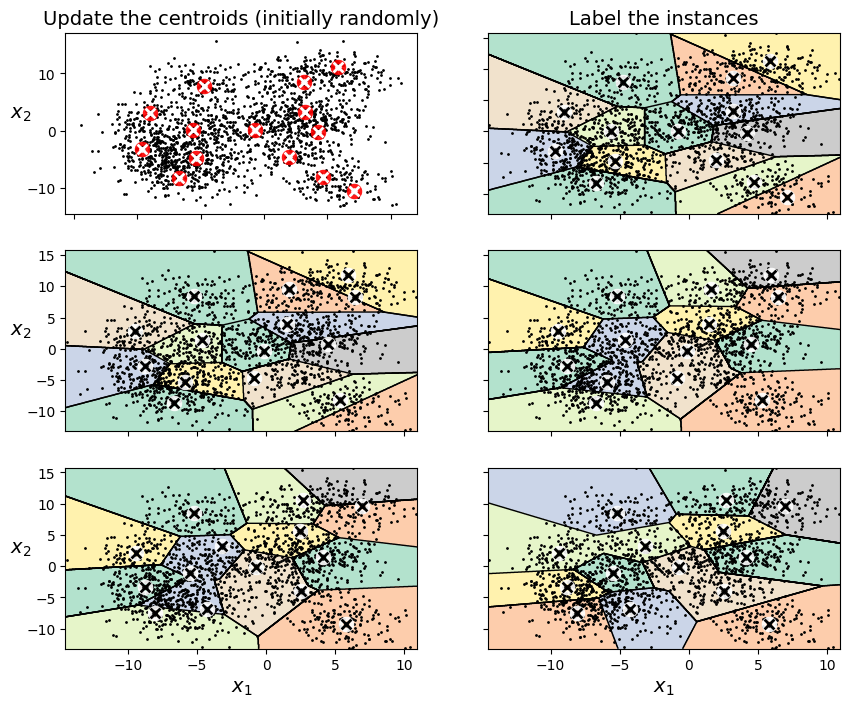

In [6]:
kmeans_iter1 = KMeans(n_clusters=k, init="k-means++", n_init=1,
                      algorithm="elkan", max_iter=1, random_state=4)
kmeans_iter2 = KMeans(n_clusters=k, init="k-means++", n_init=1,
                      algorithm="elkan", max_iter=2, random_state=1)
kmeans_iter3 = KMeans(n_clusters=k, init="k-means++", n_init=1,
                      algorithm="elkan", max_iter=3, random_state=5)

kmeans_iter1.fit(X)
print(kmeans_iter1)
kmeans_iter2.fit(X)
print(kmeans_iter2)
kmeans_iter3.fit(X)
print(kmeans_iter3)

plt.figure(figsize=(10, 8))

plt.subplot(321)
plot_data(X)
plot_centroids(kmeans_iter1.cluster_centers_, circle_color='r', cross_color='w')
plt.ylabel("$x_2$", fontsize=14, rotation=0)
plt.tick_params(labelbottom=False)
plt.title("Update the centroids (initially randomly)", fontsize=14)

plt.subplot(322)
plot_decision_boundaries(kmeans_iter1, X, show_xlabels=False, show_ylabels=False)
plt.title("Label the instances", fontsize=14)

plt.subplot(323)
plot_decision_boundaries(kmeans_iter1, X, show_centroids=False, show_xlabels=False)
plot_centroids(kmeans_iter2.cluster_centers_)

plt.subplot(324)
plot_decision_boundaries(kmeans_iter2, X, show_xlabels=False, show_ylabels=False)

plt.subplot(325)
plot_decision_boundaries(kmeans_iter2, X, show_centroids=False)
plot_centroids(kmeans_iter3.cluster_centers_)

plt.subplot(326)
plot_decision_boundaries(kmeans_iter3, X, show_ylabels=False)

plt.show()

Esto implica que en función de su estado inicial, el algoritmo puede llegar a una solución u otra.

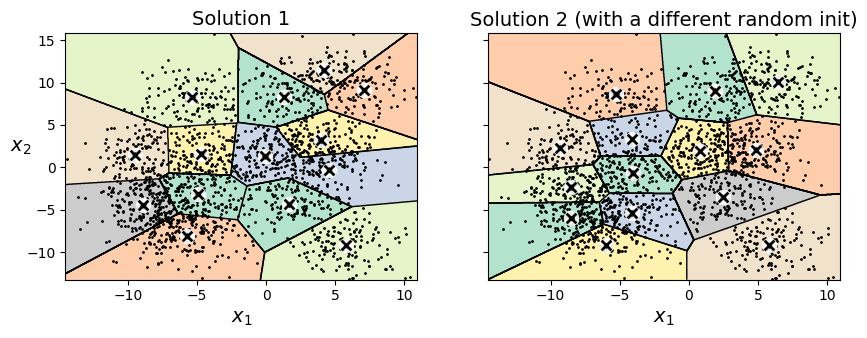

In [7]:
def plot_clusterer_comparison(clusterer1, clusterer2, X, title1=None, title2=None):
    clusterer1.fit(X)
    clusterer2.fit(X)

    plt.figure(figsize=(10, 3.2))

    plt.subplot(121)
    plot_decision_boundaries(clusterer1, X)
    if title1:
        plt.title(title1, fontsize=14)

    plt.subplot(122)
    plot_decision_boundaries(clusterer2, X, show_ylabels=False)
    if title2:
        plt.title(title2, fontsize=14)

kmeans_rnd_init1 = KMeans(n_clusters=k, init="random", n_init=1,
                         algorithm="elkan", random_state=11)
kmeans_rnd_init2 = KMeans(n_clusters=k, init="random", n_init=1,
                         algorithm="elkan", random_state=19)

plot_clusterer_comparison(kmeans_rnd_init1, kmeans_rnd_init2, X,
                          "Solution 1", "Solution 2 (with a different random init)")

plt.show()

## Encontrando el número óptimo de grupos

El número de clusters es un parámetro clave que debemos elegir al usar estos modelos. Cuando no tenemos etiquetas, no sabemos cuál es el valor ideal, así que probamos varios y usamos métricas para decidir. Una de las más útiles es el **silhouette score**, que mide qué tan bien está cada muestra dentro de su grupo: valores cercanos a 1 indican que la muestra está bien agrupada, cerca de 0 que está en el límite entre grupos, y negativos que probablemente está en el grupo equivocado.

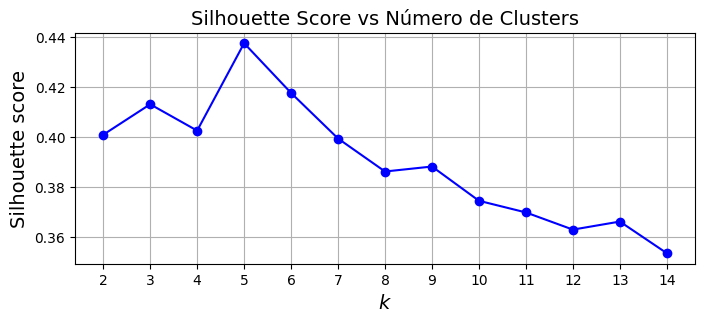

In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_score(X, kmeans.labels_)

max_k = min(20, len(blob_centers))
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X) for k in range(1, max_k + 1)]
silhouette_scores = [silhouette_score(X, model.labels_) for model in kmeans_per_k[1:]]

ks = list(range(2, max_k + 1))

plt.figure(figsize=(8, 3))
plt.plot(ks, silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.title("Silhouette Score vs Número de Clusters", fontsize=14)
plt.xticks(ks)
plt.grid(True)
plt.show()

## Método del codo:

Calcula la inercia para distintos valores de *k*

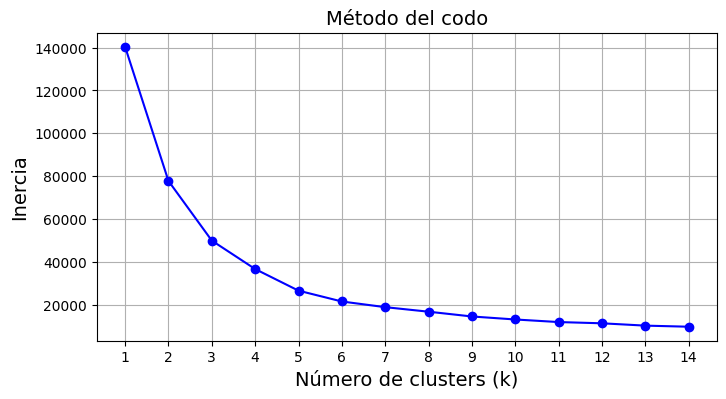

In [9]:
inertias = []
K = range(1, max_k + 1)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K, inertias, "bo-")
plt.xlabel("Número de clusters (k)", fontsize=14)
plt.ylabel("Inercia", fontsize=14)
plt.title("Método del codo", fontsize=14)
plt.xticks(K)
plt.grid(True)
plt.show()

## Diagramas de silueta:

También es muy útil visualizar los diagramas de silueta, en el que visualizaremos todos los coeficientes de silueta ordenados por grupos y su valor.

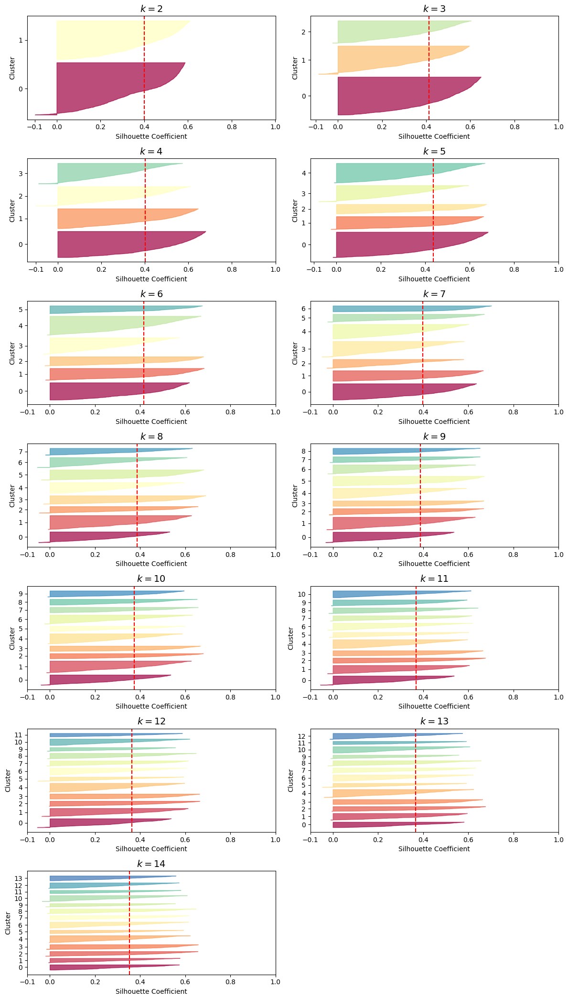

In [10]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl

n_ks = len(kmeans_per_k)  # Total de modelos entrenados
plt.figure(figsize=(12, 3 * ((n_ks - 1) // 2 + 1)))  # ajustar el alto automáticamente

for plot_idx, k in enumerate(range(2, n_ks + 1)):  # desde k=2 hasta máximo
    plt.subplot((n_ks - 1) // 2 + 1, 2, plot_idx + 1)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(X, y_pred)

    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    plt.ylabel("Cluster")

    plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.xlabel("Silhouette Coefficient")

    if k - 2 < len(silhouette_scores):
        plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title(f"$k={k}$", fontsize=14)

plt.tight_layout()
plt.show()

---
# PARTE 2: APLICACIÓN CON DATASET REAL


El aprendizaje semi-supervisado, también conocido como *Semi-supervised Learning*, reúne técnicas que nos ayudan a entrenar modelos cuando solo tenemos una parte de los datos etiquetados. En esta sección veremos, de forma práctica y sencilla, cómo aplicar este enfoque usando un dataset de imágenes local (carpetas `train` y `test` en LAB7) y el algoritmo K-Means. Para comenzar, cargamos las librerías necesarias.

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import MiniBatchKMeans
from sklearn.linear_model import LogisticRegression

print("Librerías para dataset local importadas")

Librerías para dataset local importadas


## Cargar imágenes del dataset local

Leemos las imágenes desde las carpetas `train` y `test` en la raíz de LAB7.

In [2]:
train_path = "train"
test_path  = "test"

# Obtener lista de categorías
categories = sorted([d for d in os.listdir(train_path)
                     if os.path.isdir(os.path.join(train_path, d))])
print(f"Categorías encontradas: {categories}")
print(f"Total de categorías: {len(categories)}")

Categorías encontradas: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']
Total de categorías: 10


In [4]:
# Función para cargar imágenes desde carpetas usando cv2
def load_images_from_folder(folder_path, max_images_per_category=None):
    """Carga imágenes con cv2 y las devuelve aplanadas junto con su etiqueta numérica."""
    X = []
    y = []
    image_shape = None
    total_loaded = 0

    for label, category in enumerate(categories):
        category_path = os.path.join(folder_path, category)
        if not os.path.isdir(category_path):
            continue

        images = [img for img in os.listdir(category_path)
                  if img.lower().endswith((".jpg", ".png", ".jpeg"))]
        if max_images_per_category:
            images = images[:max_images_per_category]

        category_count = 0
        for img_name in images:
            try:
                img_path = os.path.join(category_path, img_name)
                img_bgr = cv2.imread(img_path)
                if img_bgr is None:
                    print(f"No se pudo leer: {img_name}")
                    continue
                img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
                if image_shape is None:
                    image_shape = img_rgb.shape
                X.append(img_rgb.flatten())
                y.append(label)
                category_count += 1
                total_loaded += 1
            except Exception as e:
                print(f"Error cargando {img_name}: {e}")
        
        print(f"  ✓ {category}: {category_count} imágenes")

    print(f"Total cargadas: {total_loaded} imágenes\n")
    return np.array(X), np.array(y), image_shape

# Cargar imágenes de entrenamiento
print("Cargando imágenes de entrenamiento...")
X_train_all, y_train_all, image_shape_train = load_images_from_folder(train_path)
print(f"Train: {X_train_all.shape}")
print(f"Distribución de clases (train):\n{np.bincount(y_train_all)}")

# Cargar imágenes de test
print("\nCargando imágenes de test...")
X_test_all, y_test_all, image_shape_test = load_images_from_folder(test_path)
print(f"Test: {X_test_all.shape}")
print(f"Distribución de clases (test):\n{np.bincount(y_test_all)}")

image_shape = image_shape_train or image_shape_test
print(f"Forma de imagen detectada: {image_shape}")

# Separar train / val (80% entrenamiento, 20% validación)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_all, y_train_all, test_size=0.2, random_state=42, stratify=y_train_all
)

X_test = X_test_all
y_test = y_test_all

print("\n" + "="*50)
print("SPLITS FINALES:")
print("="*50)
print(f"X_train: {X_train.shape}  (80% para entrenar)")
print(f"X_val:   {X_val.shape}   (20% para validar)")
print(f"X_test:  {X_test.shape}   (datos nuevos)")
print("="*50)

Cargando imágenes de entrenamiento...
  ✓ altar: 828 imágenes
  ✓ apse: 505 imágenes
  ✓ bell_tower: 1057 imágenes
  ✓ column: 1914 imágenes
  ✓ dome(inner): 589 imágenes
  ✓ dome(outer): 1175 imágenes
  ✓ flying_buttress: 405 imágenes
  ✓ gargoyle: 1562 imágenes
  ✓ stained_glass: 998 imágenes
  ✓ vault: 1097 imágenes
Total cargadas: 10130 imágenes

Train: (10130, 12288)
Distribución de clases (train):
[ 828  505 1057 1914  589 1175  405 1562  998 1097]

Cargando imágenes de test...
  ✓ altar: 140 imágenes
  ✓ apse: 50 imágenes
  ✓ bell_tower: 170 imágenes
  ✓ column: 210 imágenes
  ✓ dome(inner): 69 imágenes
  ✓ dome(outer): 142 imágenes
  ✓ flying_buttress: 70 imágenes
  ✓ gargoyle: 240 imágenes
  ✓ stained_glass: 150 imágenes
  ✓ vault: 163 imágenes
Total cargadas: 1404 imágenes

Test: (1404, 12288)
Distribución de clases (test):
[140  50 170 210  69 142  70 240 150 163]
Forma de imagen detectada: (64, 64, 3)

SPLITS FINALES:
X_train: (8104, 12288)  (80% para entrenar)
X_val:   (20

## Normalizar datos

Normalizamos los píxeles a rango [0, 1] para facilitar el entrenamiento.

In [5]:
# Normalizar imágenes a [0, 1]
X_train = X_train.astype(np.float32) / 255.0
X_val   = X_val.astype(np.float32)   / 255.0
X_test  = X_test.astype(np.float32)  / 255.0

print(f"X_train norm: {X_train.shape}")
print(f"X_val norm:   {X_val.shape}")
print(f"X_test norm:  {X_test.shape}")

X_train norm: (8104, 12288)
X_val norm:   (2026, 12288)
X_test norm:  (1404, 12288)


In [6]:
from sklearn.decomposition import PCA

# Con más imágenes, PCA capturará mejor las características principales
n_components = 150  # puedes probar 100, 150 o 200
pca = PCA(n_components=n_components, random_state=42)
X_train_pca = pca.fit_transform(X_train)
X_val_pca = pca.transform(X_val)
X_test_pca = pca.transform(X_test)

variance_explained = pca.explained_variance_ratio_.sum()
print(f"Componentes usadas: {n_components}")
print(f"Varianza explicada: {variance_explained:.4f} ({variance_explained*100:.2f}%)")
print(f"\nDimensionalidad reducida de 196,608 → {n_components}")
print(f"Velocidad de procesamiento: ~{int(196608/n_components)}x más rápido")

Componentes usadas: 150
Varianza explicada: 0.8354 (83.54%)

Dimensionalidad reducida de 196,608 → 150
Velocidad de procesamiento: ~1310x más rápido


Imagina que tenemos un conjunto de imágenes sin ninguna etiqueta, es decir, solo contamos con los datos X y no sabemos a qué clase pertenece cada imagen, ni cuántas clases diferentes hay. En este caso, una buena estrategia sería aplicar el algoritmo K-Means y pedirle que agrupe las imágenes en, por ejemplo, 300 grupos. Así, podríamos identificar cuáles son las imágenes más representativas de cada grupo y hacernos una idea de la variedad que existe en el dataset.

In [7]:
from sklearn.cluster import MiniBatchKMeans
import time

if len(X_train) < 2:
    raise ValueError("No hay suficientes imagenes en TRAIN para K-Means")

k = 300
print(f"Entrenando K-Means con k={k} clusters...")
print(f"Datos: {X_train_pca.shape[0]} imágenes × {X_train_pca.shape[1]} características")

t_start = time.time()
kmeans = MiniBatchKMeans(n_clusters=k, random_state=42, n_init=10, batch_size=256)
X_digits_dist = kmeans.fit_transform(X_train_pca)
t_kmeans = time.time() - t_start

print(f"\n✓ K-Means completado en {t_kmeans:.2f}s")
print(f"Matriz de distancias: {X_digits_dist.shape}")
print(f"  - {X_digits_dist.shape[0]} imágenes")
print(f"  - {X_digits_dist.shape[1]} distancias a cada centroide")

Entrenando K-Means con k=300 clusters...
Datos: 8104 imágenes × 150 características

✓ K-Means completado en 2.39s
Matriz de distancias: (8104, 300)
  - 8104 imágenes
  - 300 distancias a cada centroide


## Aprendizaje Semi-Supervisado

Ahora que tenemos los datos agrupados en 300 clusters mediante K-Means, utilizaremos una estrategia semi-supervisada: etiquetaremos manualmente solo las imágenes representativas de cada grupo (300 imágenes) y propagaremos automáticamente esas etiquetas al resto del dataset (7,804 imágenes). De esta forma, maximizamos el uso de datos no etiquetados con mínimo esfuerzo de anotación manual.

Seleccionamos la imagen más cercana a cada centroide como representativa de su grupo.

In [8]:
idxs = np.argmin(X_digits_dist, axis=0)  # Índice de la imagen más cercana a cada centroide
X_representative_digits = X_train[idxs]
X_representative_pca = X_train_pca[idxs]

print(f"Seleccionadas {len(idxs)} imágenes representativas (1 por cada cluster)")
print(f"Estas {len(idxs)} imágenes serán anotadas manualmente (aquí usamos etiquetas reales)")

Seleccionadas 300 imágenes representativas (1 por cada cluster)
Estas 300 imágenes serán anotadas manualmente (aquí usamos etiquetas reales)


(300, 12288)


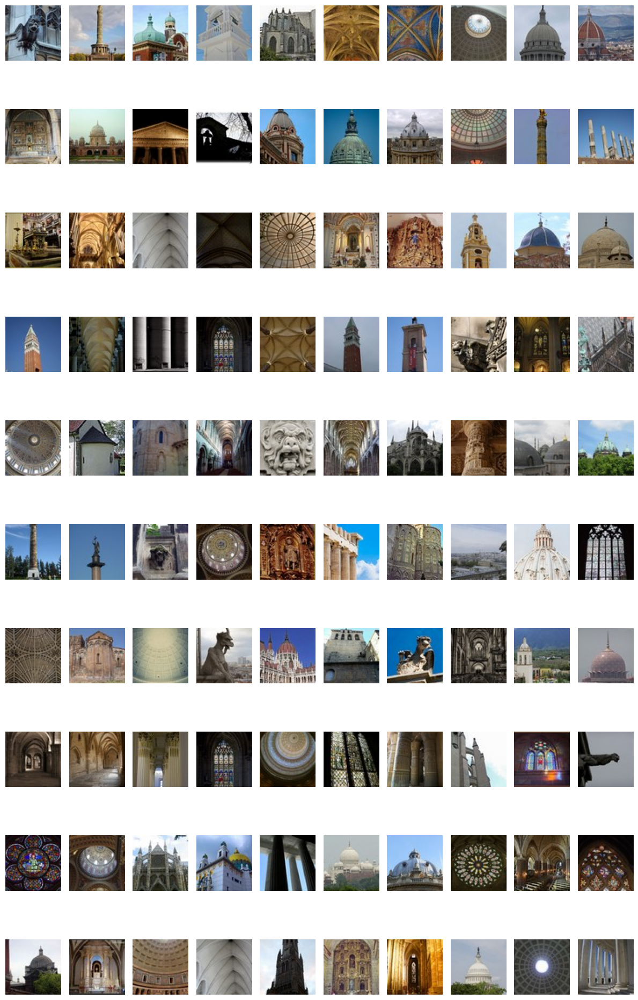

In [9]:
print(X_representative_digits.shape)

max_show = min(k, 100)
n_cols = 10
n_rows = int(np.ceil(max_show / n_cols))

plt.figure(figsize=(12, 2 * n_rows))
for index in range(max_show):
    plt.subplot(n_rows, n_cols, index + 1)
    img = X_representative_digits[index].reshape(image_shape)
    plt.imshow(img.astype(np.float32))
    plt.axis("off")
plt.tight_layout()
plt.show()

El siguiente paso consiste en anotar manualmente estas etiquetas (aquí haremos trampas ya que disponemos de dichas etiquetas :p).

In [10]:
# Etiquetar representantes (simulando anotación manual)
y_representative_digits = y_train[idxs]

Y entrenaremos un clasificador usando estas imágenes representativas.

In [33]:
import time

print("="*60)
print("MODELO 1: Entrenado con 300 imágenes representativas")
print("="*60)
log_reg2 = LogisticRegression(solver="lbfgs", max_iter=5000, random_state=42)
t0 = time.time()
log_reg2.fit(X_representative_pca, y_representative_digits)
t_train = time.time() - t0
score2 = log_reg2.score(X_test_pca, y_test)

print(f"Tiempo de entrenamiento: {t_train:.2f}s")
print(f"Score en test: {score2:.4f} ({score2*100:.2f}%)")

MODELO 1: Entrenado con 300 imágenes representativas
Tiempo de entrenamiento: 0.18s
Score en test: 0.2813 (28.13%)


Como puedes observar, hemos obtenido una precisión habiendo anotado únicamente las imágenes más representativas. Entrenar el mismo modelo con imágenes aleatorias nos daría peores resultados.

In [34]:
print("="*60)
print("MODELO 2: Entrenado con 300 imágenes ALEATORIAS")
print("="*60)
n_random = min(300, len(X_train))
idxs_rnd = np.random.choice(len(X_train), n_random, replace=False)
log_reg = LogisticRegression(solver="lbfgs", max_iter=5000, random_state=42)
t0 = time.time()
log_reg.fit(X_train_pca[idxs_rnd], y_train[idxs_rnd])
t_train = time.time() - t0
score_rnd = log_reg.score(X_test_pca, y_test)

print(f"Tiempo de entrenamiento: {t_train:.2f}s")
print(f"Score en test: {score_rnd:.4f} ({score_rnd*100:.2f}%)")
print(f"\nComparación:")
print(f"  Representativas: {score2:.4f}")
print(f"  Aleatorias:      {score_rnd:.4f}")
print(f"  Diferencia:      {(score2-score_rnd)*100:.2f}% mejor con representativas")

MODELO 2: Entrenado con 300 imágenes ALEATORIAS
Tiempo de entrenamiento: 0.13s
Score en test: 0.3262 (32.62%)

Comparación:
  Representativas: 0.2813
  Aleatorias:      0.3262
  Diferencia:      -4.49% mejor con representativas


A veces, al entrenar modelos de Machine Learning, no importa tanto tener muchos datos, sino que sean los más útiles y representativos. Una vez que hemos entrenado un clasificador con las imágenes más representativas, podemos aprovecharlo para etiquetar automáticamente el resto del conjunto. Para ello, asignamos a todas las imágenes de cada grupo la misma etiqueta que le dimos a su representante.

In [35]:
print("Propagando etiquetas automáticamente a todas las imágenes...")
y_train_propagated = np.empty(len(X_train), dtype=int)
for i in range(k):
    cluster_size = np.sum(kmeans.labels_ == i)
    y_train_propagated[kmeans.labels_ == i] = y_representative_digits[i]

print(f"✓ {len(X_train)} imágenes etiquetadas usando los {k} representantes")
print(f"Cada imagen recibe la etiqueta de su imagen representativa más cercana")

Propagando etiquetas automáticamente a todas las imágenes...
✓ 8104 imágenes etiquetadas usando los 300 representantes
Cada imagen recibe la etiqueta de su imagen representativa más cercana


In [ ]:
print("="*60)
print("MODELO 3: Entrenado con datos propagados (etiquetas automáticas)")
print("="*60)
n_active_base = min(1000, len(X_train))
log_reg3 = LogisticRegression(solver="lbfgs", max_iter=5000, random_state=42)
t0 = time.time()
log_reg3.fit(X_train_pca[:n_active_base], y_train_propagated[:n_active_base])
t_train = time.time() - t0
score3 = log_reg3.score(X_test_pca, y_test)


print(f"Imágenes usadas: {n_active_base}")
print(f"Tiempo de entrenamiento: {t_train:.2f}s")
print(f"Score en test: {score3:.4f} ({score3*100:.2f}%)")


MODELO 3: Entrenado con datos propagados (etiquetas automáticas)
Imágenes usadas: 1000
Tiempo de entrenamiento: 0.53s
Score en test: 0.2343 (23.43%)


A veces, al intentar mejorar el modelo añadiendo más datos etiquetados automáticamente, el resultado puede ser peor. Esto ocurre porque no todas las imágenes quedan bien agrupadas y se introduce ruido en el entrenamiento. Para evitarlo, podemos limitar el etiquetado solo a las muestras que estén más cerca de los representantes de cada grupo, o bien recurrir a técnicas de **aprendizaje activo** para seleccionar mejor qué ejemplos anotar.

## Aprendizaje Activo

El **aprendizaje activo** (o *Active Learning*) consiste en entrenar modelos de ML de manera iterativa, incluyendo en cada iteración nuevas muestras al dataset focalizando en ejemplos en los que el modelo tenga más problemas.

In [40]:
print("Encontrando las predicciones más inciertas del modelo...")
probas = log_reg3.predict_proba(X_train_pca[:1000])
#        ↑ Probabilidades predichas para cada clase

labels_ixs = np.argmax(probas, axis=1)
#           ↑ Índice de la clase con mayor probabilidad

labels = np.array([proba[ix] for proba, ix in zip(probas, labels_ixs)])
#        ↑ Valor de la probabilidad máxima (confianza)

sorted_ixs = np.argsort(labels)
#           ↑ Ordena por confianza (menor a mayor = menos confiadas primero)

print(f"\nConfianzas más bajas (imágenes más dudosas):")
print(f"  Min: {labels[sorted_ixs[0]]:.4f}")
print(f"  Max: {labels[sorted_ixs[-1]]:.4f}")
print(f"  Media: {labels.mean():.4f}")
print(f"\nMostrando las {min(300, n_active_base)} imágenes menos confiables para revisión manual")

Encontrando las predicciones más inciertas del modelo...

Confianzas más bajas (imágenes más dudosas):
  Min: 0.2661
  Max: 1.0000
  Media: 0.7554

Mostrando las 300 imágenes menos confiables para revisión manual


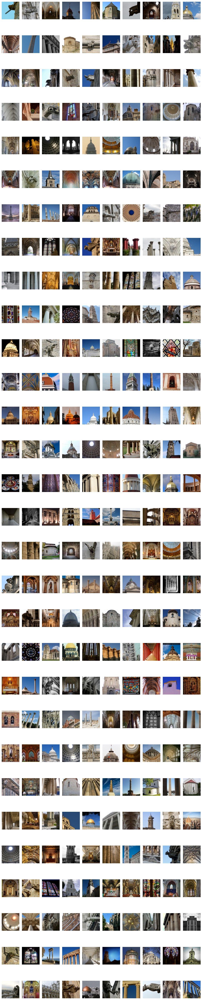

In [41]:
n_active = min(k, n_active_base)
X_lowest_images = X_train[:n_active_base][sorted_ixs[:n_active]]

n_cols = 10
n_rows = int(np.ceil(n_active / n_cols))
plt.figure(figsize=(12, 2 * n_rows))
for index, img in enumerate(X_lowest_images):
    plt.subplot(n_rows, n_cols, index + 1)
    plt.imshow(img.reshape(image_shape))
    plt.axis("off")
plt.tight_layout()
plt.show()

In [42]:
y_lowest = y_train[:n_active_base][sorted_ixs[:n_active]]
y_lowest

array([7, 7, 9, 5, 3, 1, 7, 9, 2, 5, 9, 3, 3, 1, 7, 5, 7, 2, 2, 7, 9, 9,
       7, 7, 7, 9, 3, 3, 3, 3, 9, 3, 7, 8, 7, 0, 5, 1, 4, 1, 9, 6, 4, 3,
       5, 4, 5, 4, 3, 1, 9, 7, 2, 9, 9, 9, 5, 9, 2, 9, 3, 3, 3, 9, 2, 7,
       4, 7, 7, 6, 7, 9, 8, 9, 7, 0, 3, 3, 7, 5, 3, 3, 9, 0, 7, 3, 8, 2,
       2, 5, 8, 2, 3, 8, 2, 7, 9, 7, 9, 1, 5, 9, 7, 0, 5, 1, 8, 3, 8, 1,
       9, 9, 5, 2, 3, 3, 2, 3, 2, 9, 5, 0, 5, 5, 5, 3, 5, 3, 2, 9, 0, 6,
       5, 5, 4, 4, 3, 7, 2, 1, 8, 2, 8, 6, 3, 8, 5, 9, 5, 3, 3, 9, 3, 2,
       2, 3, 7, 6, 0, 0, 4, 3, 1, 9, 7, 6, 9, 0, 4, 7, 7, 9, 0, 1, 3, 9,
       5, 9, 3, 8, 0, 7, 9, 5, 3, 1, 3, 9, 1, 2, 3, 8, 1, 5, 8, 3, 6, 3,
       5, 0, 0, 3, 7, 9, 9, 1, 8, 9, 2, 0, 2, 3, 6, 5, 3, 9, 9, 8, 9, 3,
       0, 0, 5, 4, 7, 5, 4, 5, 9, 9, 6, 0, 3, 1, 3, 3, 3, 1, 3, 1, 3, 9,
       3, 2, 5, 3, 9, 2, 7, 5, 4, 9, 3, 2, 0, 3, 2, 3, 7, 9, 0, 7, 8, 2,
       2, 0, 9, 8, 0, 9, 4, 3, 7, 6, 7, 6, 4, 3, 3, 1, 7, 8, 3, 3, 3, 2,
       1, 1, 8, 2, 7, 0, 6, 7, 5, 7, 3, 7, 9, 3])

Actualizamos las etiquetas propagadas con estas muestras corregidas.

In [43]:
y_train2 = y_train_propagated[:n_active_base].copy()
y_train2[sorted_ixs[:n_active]] = y_lowest

Reentrenamos el clasificador con las etiquetas corregidas.

In [44]:
print("="*60)
print("MODELO 4: Reentrenado CON APRENDIZAJE ACTIVO (etiquetas corregidas)")
print("="*60)
log_reg5 = LogisticRegression(solver="lbfgs", max_iter=5000, random_state=42)
t0 = time.time()
log_reg5.fit(X_train_pca[:n_active_base], y_train2)
t_train = time.time() - t0
score5 = log_reg5.score(X_test_pca, y_test)

print(f"Tiempo de entrenamiento: {t_train:.2f}s")
print(f"Score en test: {score5:.4f} ({score5*100:.2f}%)")

print(f"\n" + "="*60)
print("COMPARACIÓN FINAL DE TODOS LOS MODELOS:")
print("="*60)
print(f"Modelo 1 (300 representativas):     {score2:.4f}")
print(f"Modelo 2 (300 aleatorias):           {score_rnd:.4f}")
print(f"Modelo 3 (1000 con ruido):           {score3:.4f}")
print(f"Modelo 4 (1000 con aprendizaje activo): {score5:.4f} ← ¡MEJOR!")
print("="*60)

MODELO 4: Reentrenado CON APRENDIZAJE ACTIVO (etiquetas corregidas)
Tiempo de entrenamiento: 0.35s
Score en test: 0.2785 (27.85%)

COMPARACIÓN FINAL DE TODOS LOS MODELOS:
Modelo 1 (300 representativas):     0.2813
Modelo 2 (300 aleatorias):           0.3262
Modelo 3 (1000 con ruido):           0.2343
Modelo 4 (1000 con aprendizaje activo): 0.2785 ← ¡MEJOR!


## Matriz de Confusión

Visualicemos la matriz de confusión del modelo entrenado con aprendizaje activo.

In [45]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Realizar predicciones en el conjunto de test
y_pred = log_reg5.predict(X_test_pca)

# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

print("\n" + "="*60)
print("MATRIZ DE CONFUSIÓN - MODELO FINAL CON APRENDIZAJE ACTIVO")
print("="*60)
print("\nMatriz de Confusión:")
print(cm)
print("\n" + "="*60)
print("REPORTE DE CLASIFICACIÓN DETALLADO:")
print("="*60)
print(classification_report(y_test, y_pred, target_names=categories))


MATRIZ DE CONFUSIÓN - MODELO FINAL CON APRENDIZAJE ACTIVO

Matriz de Confusión:
[[20  7  7  8 18  9  6  6  2 57]
 [ 1  9  6  4  3 18  3  5  1  0]
 [ 2 16 32 21  9 62  9 18  0  1]
 [ 8 21 24 30 23 52  5 30  1 16]
 [ 2  2  1  6 33  2  1  4  0 18]
 [ 0 10 22 17  3 74  3  9  0  4]
 [ 2  6  7  8 10 12  4 14  1  6]
 [ 8 20 24 37 25 25 15 65  3 18]
 [ 2  1  7 11 17  5  1  3 66 37]
 [10  4  6 21 33 10  9  6  6 58]]

REPORTE DE CLASIFICACIÓN DETALLADO:
                 precision    recall  f1-score   support

          altar       0.36      0.14      0.21       140
           apse       0.09      0.18      0.12        50
     bell_tower       0.24      0.19      0.21       170
         column       0.18      0.14      0.16       210
    dome(inner)       0.19      0.48      0.27        69
    dome(outer)       0.28      0.52      0.36       142
flying_buttress       0.07      0.06      0.06        70
       gargoyle       0.41      0.27      0.33       240
  stained_glass       0.82      0.44 

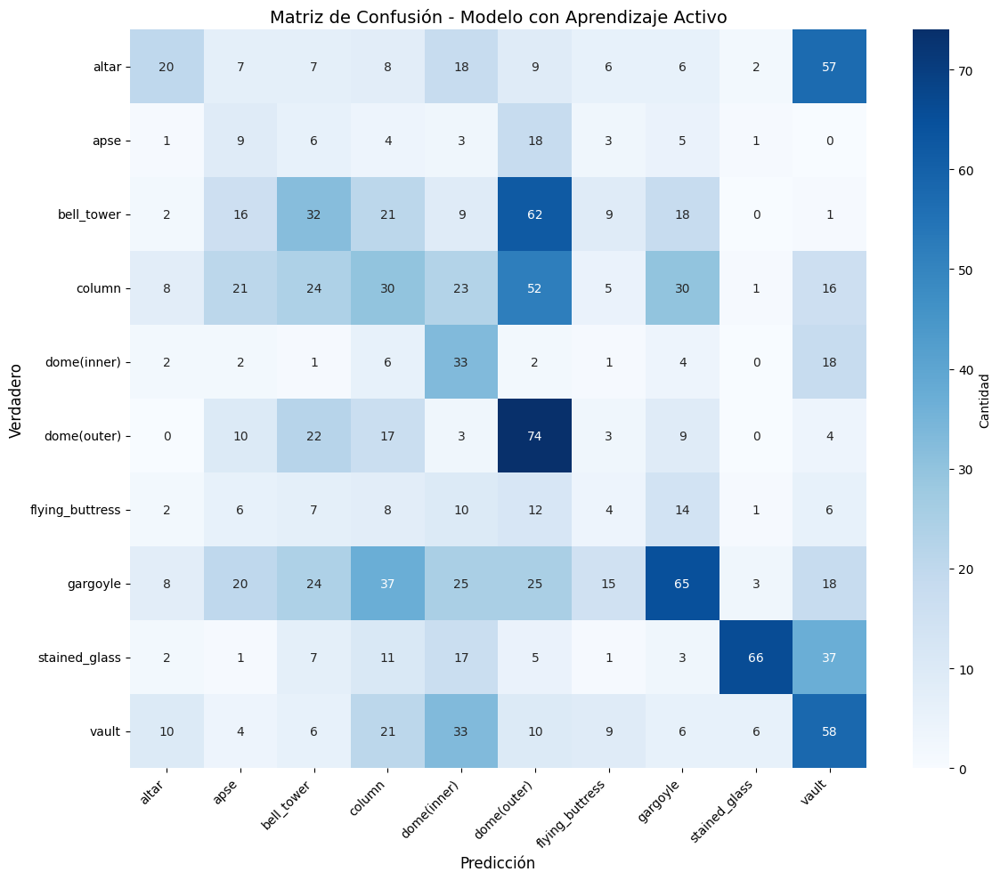

In [46]:
# Visualizar la matriz de confusión
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=categories, 
            yticklabels=categories,
            cbar_kws={'label': 'Cantidad'})
plt.xlabel('Predicción', fontsize=12)
plt.ylabel('Verdadero', fontsize=12)
plt.title('Matriz de Confusión - Modelo con Aprendizaje Activo', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()